In [1]:
!pip install tensorflow

#### Initialize Tensorflow and GPU devices, import modules

In [2]:
import tensorflow as tf
print("Tensorflow version: " + tf.__version__)

Tensorflow version: 2.11.0


In [3]:
from concurrent import futures

import io
import os
import re
import tarfile

import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as plt_colors
import pandas as pd
import tensorflow_datasets as tfds

from tensorflow import keras
from tensorflow.keras import layers

from typing import Callable, Dict, Optional, Tuple
Features = Dict[str, tf.Tensor]

### Downloading raw images and annotation locally


In [4]:
DATASET_TAR = "C:\\Users\\davis\\python-projects\\building-detection\\training_dataset\\temp\\Khartoum_train.tar.gz"

# Using tf.io.gfile allows to access AWS and GCS buckets directly
tf.io.gfile.copy("C:\\Users\\davis\\python-projects\\building-detection\\training_dataset\\SN2_buildings_train_AOI_5_Khartoum.tar.gz", DATASET_TAR)

tf.io.gfile.mkdir("C:\\Users\\davis\\python-projects\\building-detection\\training_dataset\\spacenet")
with tarfile.open(DATASET_TAR) as tar_f:
    tar_f.extractall("C:\\Users\\davis\\python-projects\\building-detection\\training_dataset\\spacenet")
    
tf.io.gfile.listdir("C:\\Users\\davis\\python-projects\\building-detection\\training_dataset\\spacenet\\AOI_5_Khartoum_Train")

AlreadyExistsError: file already exists

In [5]:
!pip install tifffile

import tifffile

_DESCRIPTION = "Spacenet (Khartoum only)"
# The directory where the raw data lives
_ROOT_DIR = "C:\\Users\\davis\\python-projects\\building-detection\\training_dataset\\spacenet\\AOI_5_Khartoum_Train"

# Min/Max RGB value ranges over data from Khartoum
# Needed for Spacenet dataset to convert pixel values into [0, 255] range.
# This can be pre-calculated in advance given access to allimages or might not
# be needed for your dataset at all.

_GLOBAL_MIN = np.array([1.0, 1.0, 23.0])
_GLOBAL_MAX = np.array([1933.0, 2047.0, 1610.0])

IMAGE_HEIGHT, IMAGE_WIDTH = 650, 650

class SpacenetConfig(tfds.core.BuilderConfig):
    """BuilderConfig for Spacenet."""
    
    def __init__(self, **kwargs):
        """
        Constructs a SpacenetConfig
        Args:
            **kwargs: keyword arguments forwarded to super
        """
        
        # Version history
        super().__init__(version=tfds.core.Version("0.0.1"), **kwargs)
        self.train_path = _ROOT_DIR
        self.min_val = _GLOBAL_MIN
        self.max_val = _GLOBAL_MAX
        
class Spacenet(tfds.core.GeneratorBasedBuilder):
    """Spacenet remote sensing dataset (Khartoum only)."""
    
    BUILDER_CONFIGS = [
        SpacenetConfig(name="Spacenet-Khartoum", description=_DESCRIPTION)
    ]
    
    def __init__(self, data_dir: Optional[str] = None, **kwargs):
        data_dir = data_dir or "C:\\Users\\davis\\python-projects\\building-detection\\training_dataset\\spacenet\\tensorflow_datasets"
        super().__init__(data_dir=data_dir, **kwargs)
        
    def _info(self) -> tfds.core.DatasetInfo:
        return tfds.core.DatasetInfo(
            builder=self,
            description=_DESCRIPTION,
            features=tfds.features.FeaturesDict({
                "image":
                    tfds.features.Image(
                        shape=[IMAGE_HEIGHT, IMAGE_WIDTH, 3],
                        encoding_format="jpeg"),
                "segmentation_mask":
                    tfds.features.Image(
                        shape=[IMAGE_HEIGHT, IMAGE_WIDTH, 1],
                        encoding_format="png"),
            }))
    
    def _split_generators(self, dl_manager):
        """Returns SplitGenerators."""
        train_path = self.builder_config.train_path
        return [
            tfds.core.SplitGenerator(
                name=tfds.Split.TRAIN,
                gen_kwargs={"root_path": train_path},),
        ]
    
    def _generate_examples(self, root_path:str):
        """Yields examples from raw data."""
        max_per_channel = self.builder_config.max_val
        min_per_channel = self.builder_config.min_val
        path = os.path.join(root_path, "RGB-PanSharpen")
        buildings_path = os.path.join(root_path, "summaryData")
        # Reading polygons coordinates and label them with respect to the img number
        csv_files = tf.io.gfile.glob(buildings_path+"/*.csv")
        with tf.io.gfile.GFile(csv_files[0], "r") as fid:
            df = pd.read_csv(fid)
        df["image"] = [x.split("_img")[-1] for x in df.ImageId]
        files = tf.io.gfile.glob(path+"/*.tif")
        for filename in files:
            # Extract the image ID XXX from "RGB-PanSharpen_AOI_5_Khartoum_imgXXX.tif"
            buildings_filename = filename.split("_")[-1].split(".")[0][3:]
            yield filename, {
                "image": self._load_tif(filename, max_per_channel, min_per_channel),
                "segmentation_mask": self._load_mask(df, buildings_filename),
            }
            
    def get_poly_coordinates(self, poly: str) -> np.ndarray:
        """Returns polygons coordinates as numpy array."""
        return np.array([
            pp.split(" ") for pp in re.findall(r"[0-9.\-]+ [0-9.\-]+ [0-9.\-]+", poly)
        ], dtype=np.float32)
    
    def _load_mask(self, df: pd.core.series.Series, buildings_filename: str) -> np.ndarray:
        """Returns a loaded segmentation mask image"""
        mask = np.zeros((IMAGE_HEIGHT, IMAGE_WIDTH, 1), dtype=np.uint8)
        buildings = df[df.image == buildings_filename]
        for _, building in buildings.iterrows():
            poly_coord = self.get_poly_coordinates(building.PolygonWKT_Pix)
            if poly_coord.size > 0:
                # Subindex polygon coordinate from [x, y, 0] to [x, y]
                poly_coord = poly_coord[:, :2]
                cv2.fillPoly(mask, [np.array(poly_coord, dtype=np.int32)], 1)
                
        return mask.astype(np.uint8)
    
    def _load_tif(self, filename: str, max_per_channel: np.ndarray, min_per_channel: np.ndarray) -> np.ndarray:
        """Loads TIF file and returns as an image array in [0, 1]."""
        with tf.io.gfile.GFile(filename, "rb") as fid:
            img = tifffile.imread(
                io.BytesIO(fid.read())).astype(np.float32)
        img = (img - min_per_channel) / (max_per_channel - min_per_channel) * 255
        img = np.clip(img, 0, 255).astype(np.uint8)
        return img
    
# Convert raw data into TFRecord form and prepare for access.
tfds_builder = Spacenet()
tfds_builder.download_and_prepare()

### Pipeline

create_dataset function batches, shuffles and preprocesses the dataset according to given paramaters.

In [6]:
AUTOTUNE = tf.data.experimental.AUTOTUNE

def create_dataset(dataset_builder, split: str, preprocess_fn: Callable[[Features], Features], batch_size: int, num_epochs: Optional[int] = None, shuffle: bool = False, shuffle_buffer_size: int = 1000) -> tf.data.Dataset:
    """Returns a dataset to be used with TensorFlow2."""
    read_config = tfds.ReadConfig(options=tf.data.Options())
    
    ds = dataset_builder.as_dataset(read_config = read_config, split=split, shuffle_files=shuffle)
    
    ds = ds.repeat(num_epochs)
    
    if shuffle:
        ds = ds.shuffle(shuffle_buffer_size)
    ds = ds.map(preprocess_fn, num_parallel_calls=AUTOTUNE)
    ds = ds.batch(batch_size, drop_remainder=True)
    
    return ds.prefetch(AUTOTUNE)

In [7]:
TRAIN_SPLIT = "train[:70%]"
VAL_SPLIT = "train[70%:90%]"
TEST_SPLIT = "train[90%:]"

### The Dataset

Are there any problems?

Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


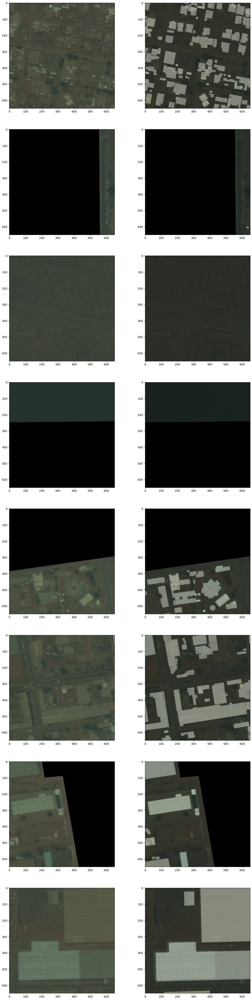

In [8]:
BATCH_SIZE = 8
ds = create_dataset(Spacenet(), split=TRAIN_SPLIT, shuffle=False, preprocess_fn = lambda x: x, batch_size = BATCH_SIZE)

for batch in ds.take(1):
    fig, axs = plt.subplots(nrows=BATCH_SIZE, ncols=2, figsize=(16, 8*BATCH_SIZE))
    for i in range(BATCH_SIZE):
        axs[i, 0].imshow(batch["image"][i])
        axs[i, 1].imshow(batch["image"][i])
        axs[i, 1].imshow(tf.squeeze(batch["segmentation_mask"][i]), cmap='gray', alpha=0.3)

### Define preprocessing

We will use 3 easy pre-processing techniques:
- Scaling pixels to [0, 1] range
- Resizing an image to a fixed size of (448, 448)
- Randomly adjusting the brightness of the image

In [9]:
import functools

def preprocess_fn(features: Dict[str, tf.Tensor], is_training: bool) -> Tuple[tf.Tensor, tf.Tensor]:
    """Runs preprocessing and converts examples into a keras compatible format."""
    image = features["image"]
    mask = features["segmentation_mask"]
    # Rescale the image to [0..1]
    image = tf.cast(image, tf.float32) / 255.0
    # Resize the image and mask to (448, 448)
    # Round resize mask values to nearest integer
    image = tf.image.resize(image, (448, 448))
    mask = tf.cast(tf.image.resize(mask, (448, 448)), tf.int32)
    # if training, apply random brightness change.
    if is_training:
        image = tf.image.random_brightness(image, max_delta=0.2)
    return image, mask

train_preprocess_fn = functools.partial(preprocess_fn, is_training=True)
validation_preprocess_fn = functools.partial(preprocess_fn, is_training=False)
test_preprocess_fn = functools.partial(preprocess_fn, is_training=False)

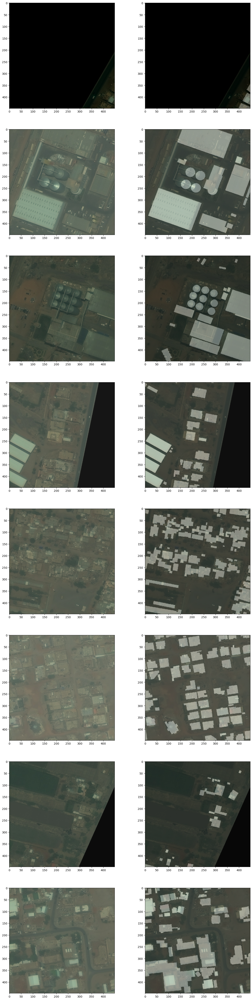

In [10]:
train_ds = create_dataset(Spacenet(), split=TRAIN_SPLIT, shuffle=True, preprocess_fn=train_preprocess_fn, batch_size=BATCH_SIZE)

for batch in train_ds.take(1):
    fig, axs = plt.subplots(nrows=BATCH_SIZE, ncols=2, figsize=(16, 8*BATCH_SIZE))
    for i in range(BATCH_SIZE):
        axs[i, 0].imshow(batch[0][i])
        axs[i, 1].imshow(tf.squeeze(batch[0][i]))
        axs[i, 1].imshow(tf.squeeze(batch[1][i]), cmap='gray', alpha=0.3)

### Convolutional model

The model consists of:
- Feature extractor(A bunch of convolutions and downsamplings)
- Decoder(A bunch of upsamplings and convolutions, followed by a fully connected head for each pixel)

In [11]:
def get_model(img_size, num_classes):
    inputs = keras.Input(shape=img_size + (3,))
    
    ### === Feature extractor ===
    # This can be separately trained with a classification head for pre-training
    
    # Entry block
    x = layers.Conv2D(32, 3, strides=2, padding="same")(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)
    
    previous_block_activation = x # Set aside residual
    
    # Blocks 1, 2, 3 are identical apart from the feature depth
    for filters in [64, 128, 256]:
        x = layers.Activation("relu")(x)
        x = layers.SeparableConv2D(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)
        
        x = layers.Activation("relu")(x)
        x = layers.SeparableConv2D(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)
        
        # Downscaling
        x = layers.MaxPooling2D(3, strides=2, padding="same")(x)
        
        # Project residual
        residual = layers.Conv2D(filters, 1, strides=2, padding="same")(
            previous_block_activation
        )
        
        x = layers.add([x, residual])  # Add back residual
        previous_block_activation = x  # Set aside next residual
        
        ### === Segmenation decoder ===
        # Takes features generated by the feature extractor and produces segmentation outputs.
        
    previous_block_activation = x # Set aside residual

    for filters in [256, 128, 64, 32]:
        x = layers.Activation("relu")(x)
        x = layers.Conv2DTranspose(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)

        x = layers.Activation("relu")(x)
        x = layers.Conv2DTranspose(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)

        # Upsacling
        x = layers.UpSampling2D(2)(x)

        # Project residual
        residual = layers.UpSampling2D(2)(previous_block_activation)
        residual = layers.Conv2D(filters, 1, padding="same")(residual)
        x = layers.add([x, residual])  # Add back residual
        previous_block_activation = x  # Set aside next residual
        
    # Add a per-pixel classification layer to assign segmentation classes.
    outputs = layers.Conv2D(num_classes, 3, activation="softmax", padding="same")(x)

    # Define the model
    model = keras.Model(inputs, outputs)
    return model  

In [12]:
model = get_model((448, 448), 2)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 448, 448, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 224, 224, 32  896         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 224, 224, 32  128        ['conv2d[0][0]']                 
 alization)                     )                                                             

 max_pooling2d_2 (MaxPooling2D)  (None, 28, 28, 256)  0          ['batch_normalization_6[0][0]']  
                                                                                                  
 conv2d_3 (Conv2D)              (None, 28, 28, 256)  33024       ['add_1[0][0]']                  
                                                                                                  
 add_2 (Add)                    (None, 28, 28, 256)  0           ['max_pooling2d_2[0][0]',        
                                                                  'conv2d_3[0][0]']               
                                                                                                  
 activation_7 (Activation)      (None, 28, 28, 256)  0           ['add_2[0][0]']                  
                                                                                                  
 conv2d_transpose (Conv2DTransp  (None, 28, 28, 256)  590080     ['activation_7[0][0]']           
 ose)     

                                                                                                  
 conv2d_6 (Conv2D)              (None, 224, 224, 64  8256        ['up_sampling2d_5[0][0]']        
                                )                                                                 
                                                                                                  
 add_5 (Add)                    (None, 224, 224, 64  0           ['up_sampling2d_4[0][0]',        
                                )                                 'conv2d_6[0][0]']               
                                                                                                  
 activation_13 (Activation)     (None, 224, 224, 64  0           ['add_5[0][0]']                  
                                )                                                                 
                                                                                                  
 conv2d_tr

### Training

In [20]:
val_ds = create_dataset(Spacenet(), split=VAL_SPLIT, shuffle=False, preprocess_fn=validation_preprocess_fn,batch_size=BATCH_SIZE)
model = get_model((448, 448), 2)
model.compile(optimizer='rmsprop', loss="sparse_categorical_crossentropy", metrics=['accuracy'])
history = model.fit(train_ds, epochs=10, steps_per_epoch=200, validation_data=val_ds, validation_steps=4)

Epoch 1/10
200/200 [==============================] - 2654s 13s/step - loss: 0.5832 - accuracy: 0.8243 - val_loss: 0.4157 - val_accuracy: 0.8612
Epoch 2/10
200/200 [==============================] - 2688s 13s/step - loss: 0.2894 - accuracy: 0.8767 - val_loss: 0.7379 - val_accuracy: 0.8612
Epoch 3/10
200/200 [==============================] - 2869s 14s/step - loss: 0.2561 - accuracy: 0.8881 - val_loss: 0.4684 - val_accuracy: 0.8616
Epoch 4/10
200/200 [==============================] - 3051s 15s/step - loss: 0.2261 - accuracy: 0.9009 - val_loss: 0.3768 - val_accuracy: 0.8646
Epoch 5/10
200/200 [==============================] - 2757s 14s/step - loss: 0.2224 - accuracy: 0.9036 - val_loss: 0.5481 - val_accuracy: 0.6400
Epoch 6/10
200/200 [==============================] - 2146s 11s/step - loss: 0.2110 - accuracy: 0.9076 - val_loss: 0.1563 - val_accuracy: 0.9297
Epoch 7/10
200/200 [==============================] - 2124s 11s/step - loss: 0.1938 - accuracy: 0.9155 - val_loss: 0.1603 - val_ac

### Training performance


1/1 [==============================] - 4s 4s/step


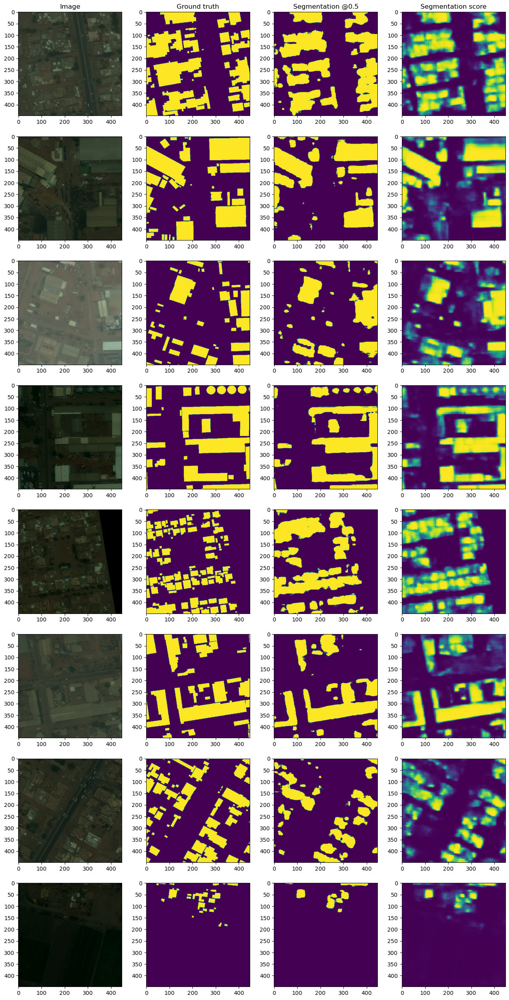

In [21]:
for batch in train_ds.take(1):
    predictions = model.predict(batch[0])
    fig, axs = plt.subplots(nrows=BATCH_SIZE, ncols=4, figsize=(16, 4*BATCH_SIZE))
    for i in range(BATCH_SIZE):
        axs[i, 0].imshow(batch[0][i])
        axs[i, 1].imshow(tf.squeeze(batch[1][i]))
        axs[i, 2].imshow(tf.squeeze(predictions[i, :, :, 1] > 0.5))
        axs[i, 3].imshow(tf.squeeze(predictions[i, :, :, 1]))
    axs[0, 0].set_title('Image')
    axs[0, 1].set_title('Ground truth')
    axs[0,2].set_title('Segmentation @0.5')
    axs[0,3].set_title('Segmentation score')

### Validation performance

tf.Tensor(
[[[[0.28019962 0.2841212  0.22921918]
   [0.2858894  0.28981096 0.23490897]
   [0.28754508 0.29146665 0.23656468]
   ...
   [0.30334386 0.33079484 0.26804975]
   [0.33639085 0.36384183 0.30109674]
   [0.34901983 0.3764708  0.3137257 ]]

  [[0.29059604 0.2945176  0.23961563]
   [0.29243758 0.29635915 0.2414572 ]
   [0.2901961  0.29411766 0.23921569]
   ...
   [0.3010252  0.33378083 0.2683834 ]
   [0.31282255 0.34557816 0.28018075]
   [0.3054274  0.33818302 0.2727856 ]]

  [[0.2948893  0.29881087 0.24390887]
   [0.29754028 0.30146185 0.24655987]
   [0.2901326  0.29405418 0.23915221]
   ...
   [0.2803004  0.31659243 0.24992575]
   [0.27959076 0.31588277 0.24921608]
   [0.2742399  0.3105319  0.24386524]]

  ...

  [[0.19499265 0.22155803 0.19299792]
   [0.19460887 0.22156079 0.18919015]
   [0.21637385 0.24245487 0.21051967]
   ...
   [0.2818539  0.2975402  0.2426382 ]
   [0.28645056 0.30213684 0.24723488]
   [0.28312463 0.2988109  0.24390891]]

  [[0.17059335 0.20185149 0.173131

1/1 [==============================] - 3s 3s/step


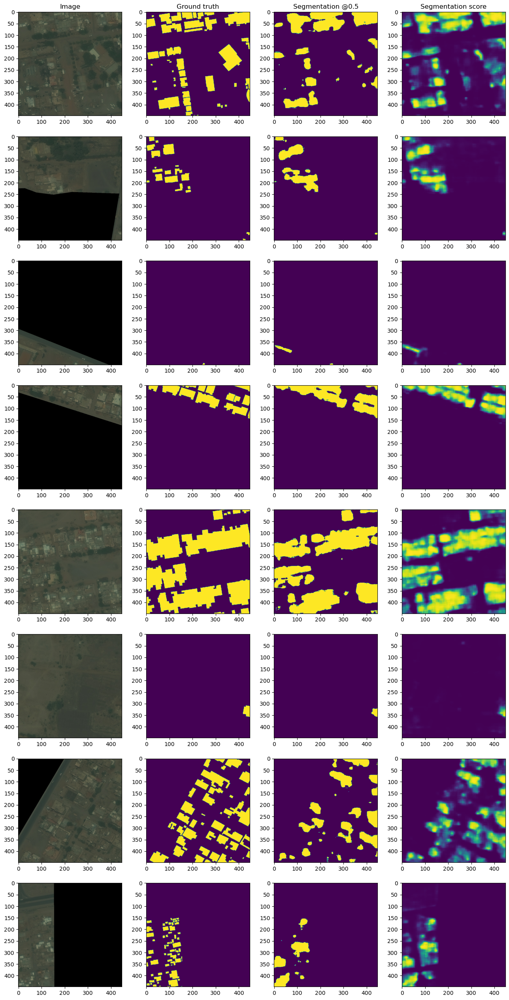

In [26]:
for batch in val_ds.take(1):
    print(batch[0])
    predictions = model.predict(batch[0])
    fig, axs = plt.subplots(nrows=BATCH_SIZE, ncols=4, figsize=(16, 4*BATCH_SIZE))
    for i in range(BATCH_SIZE):
        axs[i, 0].imshow(batch[0][i])
        axs[i, 1].imshow(tf.squeeze(batch[1][i]))
        axs[i, 2].imshow(tf.squeeze(predictions[i, :, :, 1] > 0.5))
        axs[i, 3].imshow(tf.squeeze(predictions[i, :, :, 1]))
        
    axs[0,0].set_title('Image')
    axs[0,1].set_title('Ground truth')
    axs[0,2].set_title('Segmentation @0.5')
    axs[0,3].set_title('Segmentation score')

### Evaluating the model

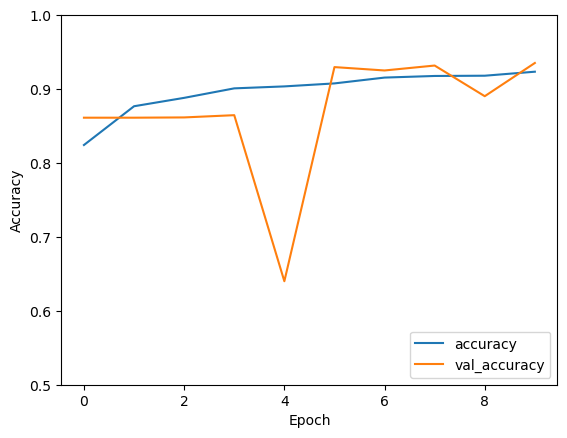

In [23]:
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1])
plt.legend(loc='lower right')

### Saving the model for later use

In [24]:
MODEL_DIR = "C:\\Users\\davis\\python-projects\\building-detection\\model"

model.save(MODEL_DIR)

INFO:tensorflow:Assets written to: C:\Users\davis\python-projects\building-detection\model\assets


INFO:tensorflow:Assets written to: C:\Users\davis\python-projects\building-detection\model\assets


Checking if the model has been saved correctly

In [25]:
new_model = tf.keras.models.load_model(MODEL_DIR)

# Check its architecture
new_model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 448, 448, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_18 (Conv2D)             (None, 224, 224, 32  896         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_30 (BatchN  (None, 224, 224, 32  128        ['conv2d_18[0][0]']              
 ormalization)                  )                                                           

 max_pooling2d_8 (MaxPooling2D)  (None, 28, 28, 256)  0          ['batch_normalization_36[0][0]'] 
                                                                                                  
 conv2d_21 (Conv2D)             (None, 28, 28, 256)  33024       ['add_15[0][0]']                 
                                                                                                  
 add_16 (Add)                   (None, 28, 28, 256)  0           ['max_pooling2d_8[0][0]',        
                                                                  'conv2d_21[0][0]']              
                                                                                                  
 activation_37 (Activation)     (None, 28, 28, 256)  0           ['add_16[0][0]']                 
                                                                                                  
 conv2d_transpose_16 (Conv2DTra  (None, 28, 28, 256)  590080     ['activation_37[0][0]']          
 nspose)  

 up_sampling2d_20 (UpSampling2D  (None, 224, 224, 64  0          ['batch_normalization_42[0][0]'] 
 )                              )                                                                 
                                                                                                  
 conv2d_24 (Conv2D)             (None, 224, 224, 64  8256        ['up_sampling2d_21[0][0]']       
                                )                                                                 
                                                                                                  
 add_19 (Add)                   (None, 224, 224, 64  0           ['up_sampling2d_20[0][0]',       
                                )                                 'conv2d_24[0][0]']              
                                                                                                  
 activation_43 (Activation)     (None, 224, 224, 64  0           ['add_19[0][0]']                 
          